In [1]:
#!pip install keras
#!pip install numpy
#!pip install imageio
#!pip install matplotlib
#!pip install opencv-python
#!pip install pydot
#!pip install graphviz


import threading
import sys
import cv2
import sys
import os
import csv
import itertools
import numpy as np
from PIL import Image
import imageio
import itertools as it
import tensorflow as tf
import keras
import pprint as pp
print("Keras version %s" % keras.__version__)
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras import backend as K

print("Tensorflow version %s" % tf.__version__)

import pprint
pp = pprint.PrettyPrinter(depth=6)

Using TensorFlow backend.


Keras version 2.0.4
Tensorflow version 1.1.0


In [2]:
# Add the standard include path for FoosMetrics
sys.path.insert(0, './../../Code')

import importlib
import process
importlib.reload(process)

<module 'process' from './../../Code\\process.py'>

In [7]:
# Load the data and frames, and add the normalizer
training = process.Processor("segmentation_loader.json")
validation = process.Processor("segmentation_loader.json")
#validation = process.Processor("data_loader_validation.json")
#output_names = ["g1","d1","o1","f1","f2","o2","d2","g2","-2"]

Creating transform: random_video_loader
Adding folder '.\..\..\Data\Raw\RawMatchesContinuous\'
'.\..\..\Data\Raw\RawMatchesContinuous\Bart9_1.mp4': 3430 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Bart9_2.mp4': 8916 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Bart9_3.mp4': 15947 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Bart9_4.mp4': 15260 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Bart9_5.mp4': 6345 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Nationals2_1.mp4': 511 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Nationals2_2.mp4': 1471 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Nationals2_3.mp4': 931 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Texas9_1.mp4': 10354 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Texas9_2.mp4': 5318 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Texas9_3.mp4': 6016 frames found.
'.\..\..\Data\Raw\RawMatchesContinuous\Texas9_4.mp4': 7837 frames found.
'.\..\..\Data\Raw\Raw

(256, 512, 3)
(256, 1024, 3)


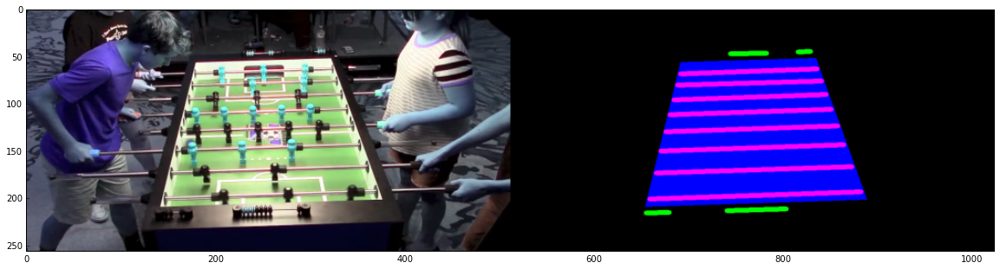

(256, 512, 3)
(256, 1024, 3)


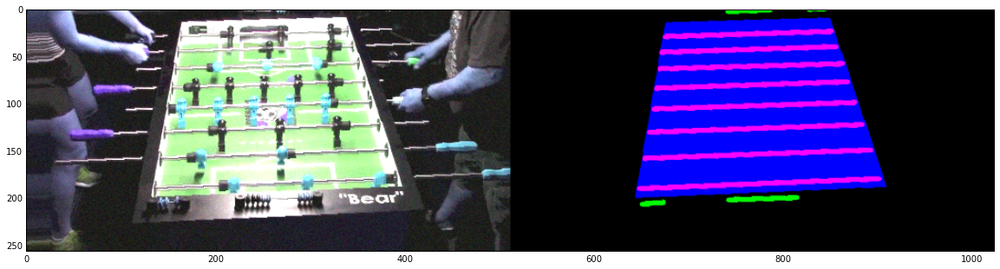

(256, 512, 3)
(256, 1024, 3)


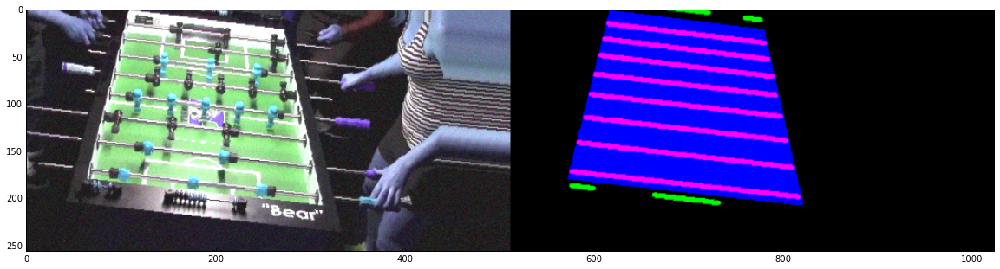

(256, 512, 3)
(256, 1024, 3)


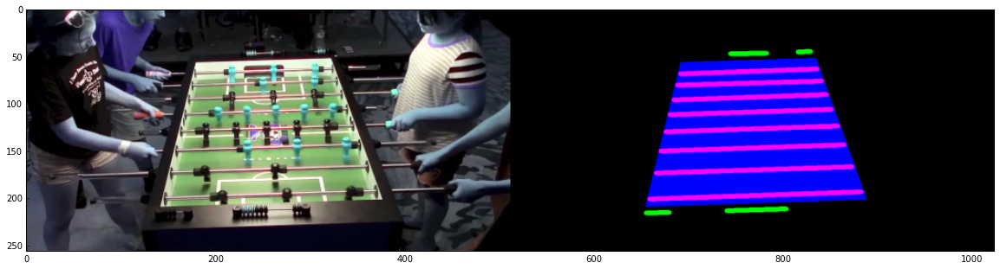

(256, 512, 3)
(256, 1024, 3)


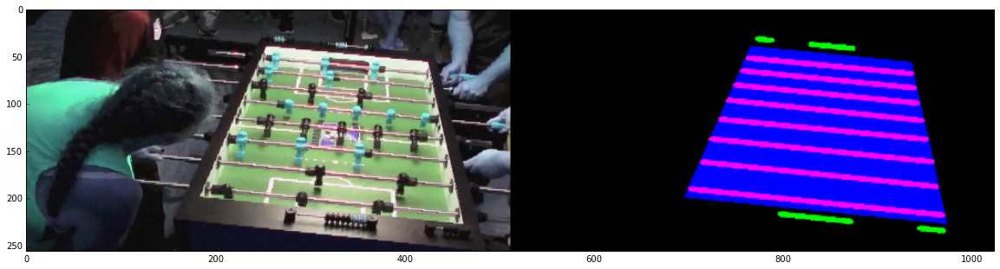

(256, 512, 3)
(256, 1024, 3)


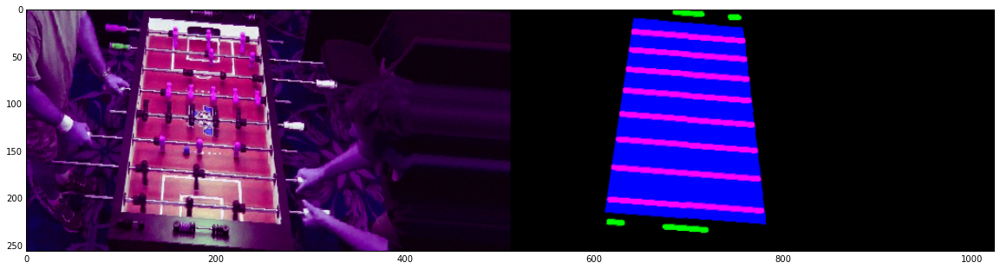

(256, 512, 3)
(256, 1024, 3)


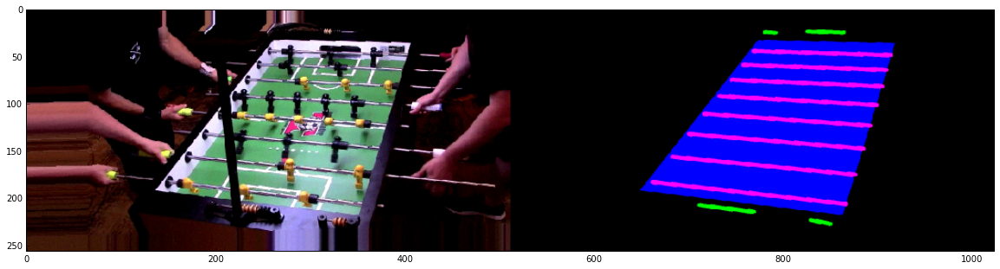

(256, 512, 3)
(256, 1024, 3)


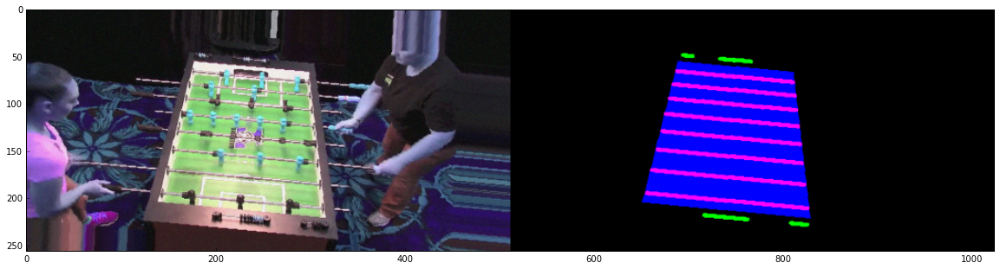

(256, 512, 3)
(256, 1024, 3)


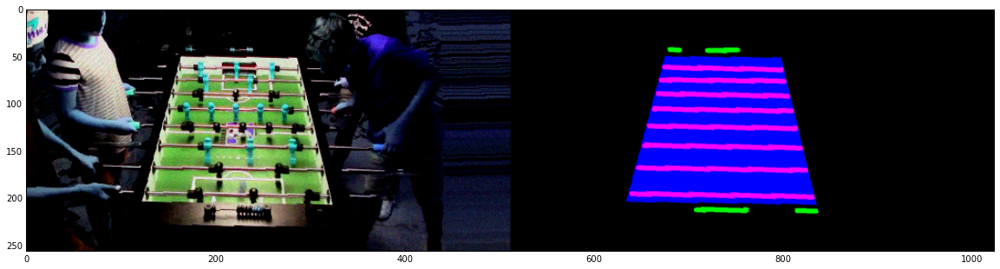

(256, 512, 3)
(256, 1024, 3)


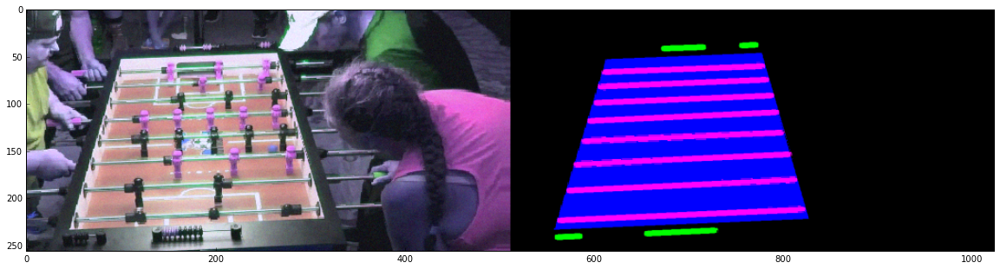

(256, 512, 3)
(256, 1024, 3)


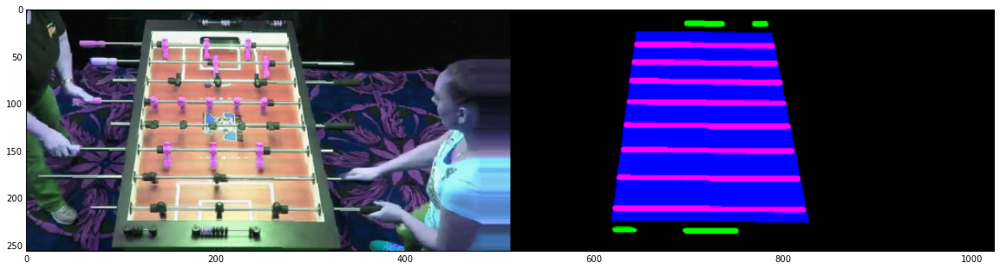

(256, 512, 3)
(256, 1024, 3)


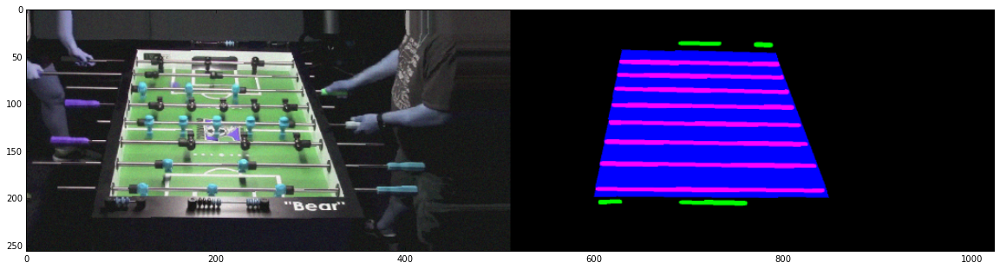

(256, 512, 3)
(256, 1024, 3)


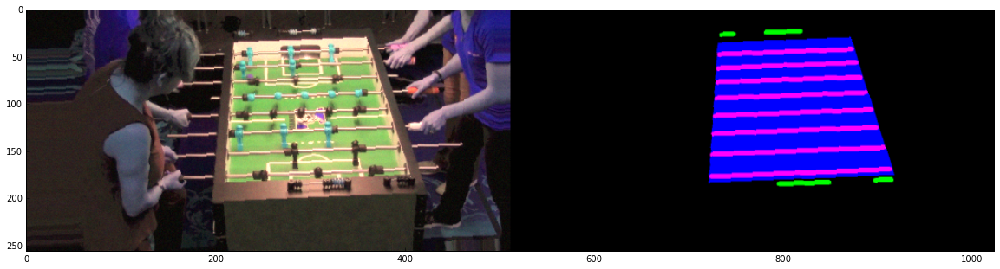

(256, 512, 3)
(256, 1024, 3)


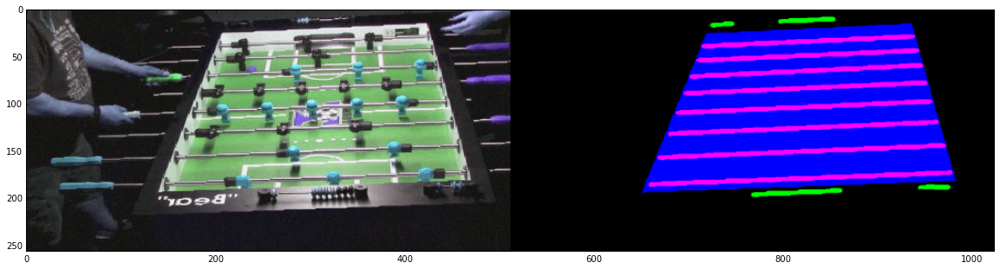

(256, 512, 3)
(256, 1024, 3)


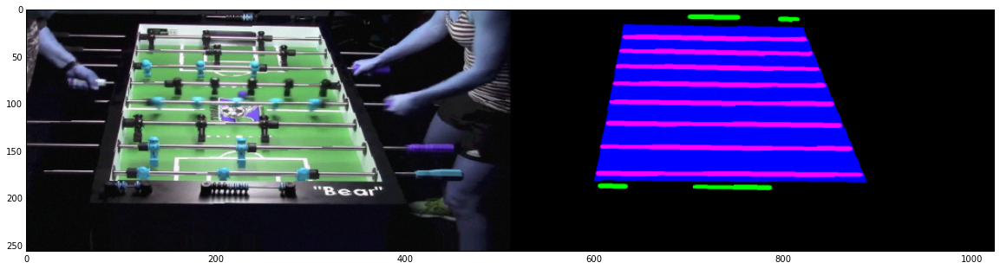

(256, 512, 3)
(256, 1024, 3)


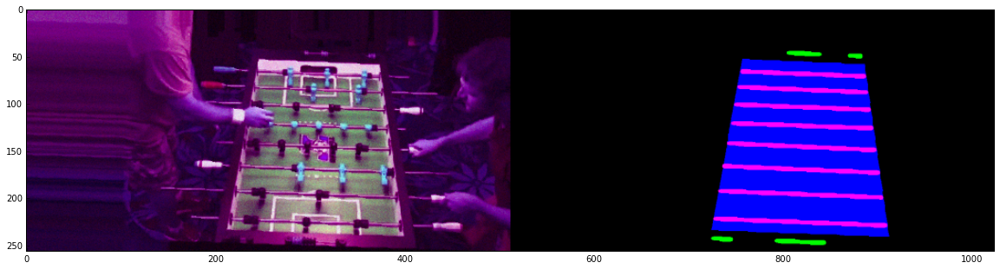

(256, 512, 3)
(256, 1024, 3)


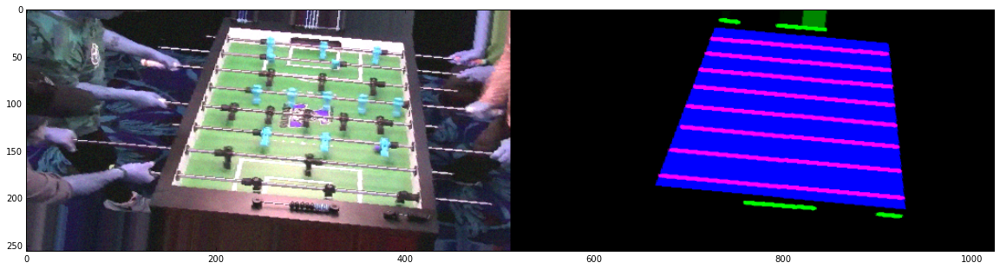

(256, 512, 3)
(256, 1024, 3)


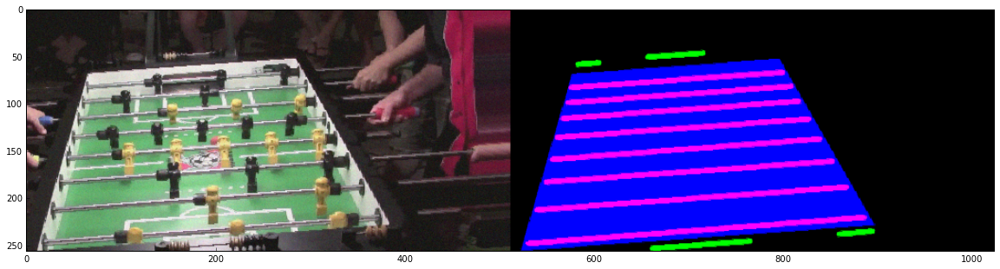

(256, 512, 3)
(256, 1024, 3)


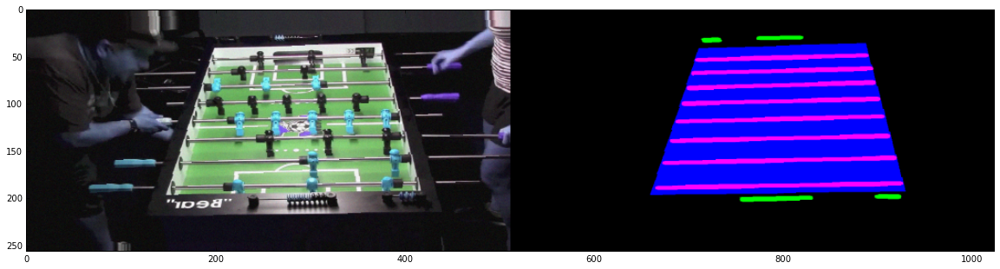

(256, 512, 3)
(256, 1024, 3)


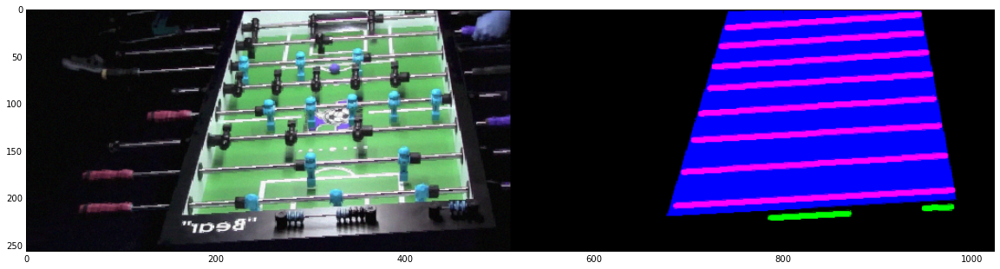

In [8]:
import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

# View the first few frames
for k in range(20):
    data = training.get_next_frame()
    print(data["frame"].shape)
    frames = np.concatenate((data["frame"],data["segmentation"]),1)
    print(frames.shape)
    fig, ax = plt.subplots(figsize=(24, 5))
    plt.imshow(frames)
    plt.show()

In [13]:
# https://stanford.edu/~shervine/blog/keras-generator-multiprocessing.html
class threadsafe_iter(object):
  """
    Takes an iterator/generator and makes it thread-safe by
    serializing call to the `next` method of given iterator/generator.
    """
  def __init__(self, it):
      self.it = it
      self.lock = threading.Lock()

  def __iter__(self):
      return self

  def __next__(self):
      with self.lock:
          return self.it.__next__()

# https://stanford.edu/~shervine/blog/keras-generator-multiprocessing.html
def threadsafe_generator(f):
  """
    A decorator that takes a generator function and makes it thread-safe.
    """
  def g(*a, **kw):
      return threadsafe_iter(f(*a, **kw))
  return g


# Define our training and validation iterators
@threadsafe_generator
def TrainGen(training):
    while True:
        data = training.get_next_frame()
        if data is not None:
            frame = data["frame"]
            segmentation = data["segmentation"]
            
            while frame is not None:
                yield (frame, segmentation)
                data = training.get_next_frame()
                if data is not None:
                    frame = data["frame"]
                    segmentation = data["segmentation"]
                else:
                    frame = None
                    segmentation = None
                
             
# Generators for training the position
@threadsafe_generator
def TrainBatchGen(batch_size, training):
    gen = TrainGen(training)
    while True:
        # Build the next batch
        batch_frames = np.zeros(shape=(batch_size, 256, 512, 3), dtype=np.float32)
        batch_segmentations = np.zeros(shape=(batch_size, 256, 512, 3), dtype=np.float32)
        for i in range(batch_size):
            (frame, segmentation) = next(gen)
            batch_frames[i,:,:,:] = frame
            batch_segmentations[i,:,:,:] = segmentation
            
        
        #pp.pprint("Yielding batch")
        #pp.pprint(batch_outputs)
        yield (batch_frames, batch_segmentations)
        #pp.pprint("Yielded batch")

    
    
        
    


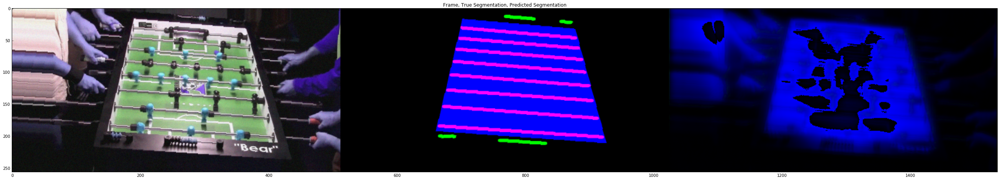

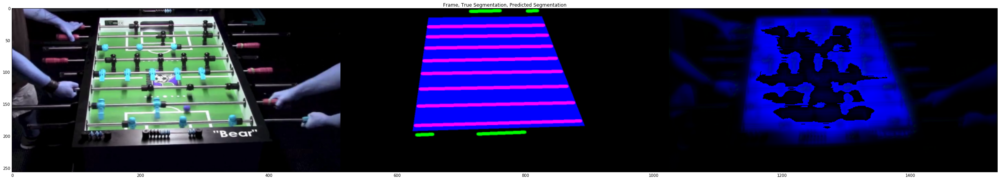

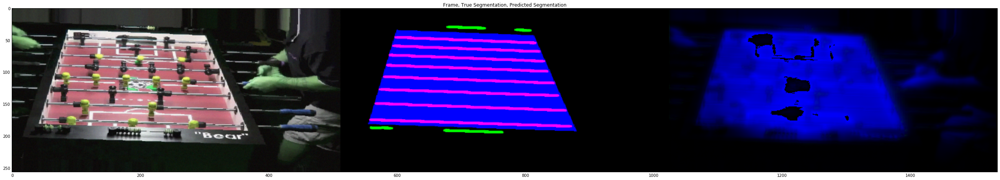

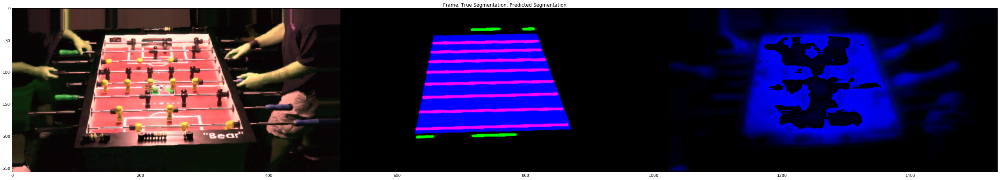

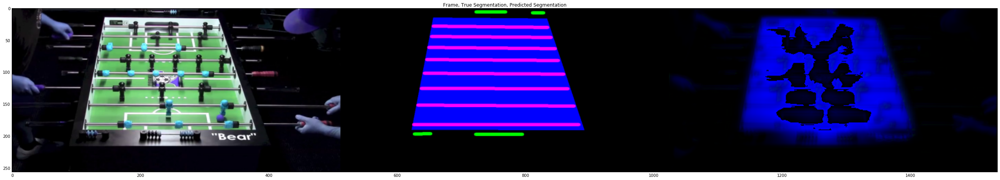

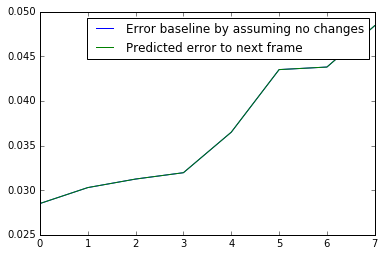

In [20]:
from keras.losses import mean_squared_error

# Utilities for plotting the result and training
def plot_validate(generator, model, count, name):   
    errors_true = []
    errors_prediction = []
    
    
    while len(errors_true) < count:
        
        (frames, outputs_true) = next(generator)
        outputs_predicted = model.predict(frames, batch_size=frames[0].shape[0], verbose=0)
        
        for i in range(outputs_predicted.shape[0]):
            if len(errors_true) < 5:
                # View the first set
                inputs = np.concatenate((frames[i], outputs_true[i], outputs_predicted[i]),1)
                fig, ax = plt.subplots(figsize=(45, 8))
                h = plt.imshow(inputs)
                plt.title( 'Frame, True Segmentation, Predicted Segmentation' )
                plt.show()
            
            # Calculate the actual difference and predicted image difference
            mse_predicted = ((outputs_true[i] - outputs_predicted[i]) ** 2).mean()
            #mse_true = K.eval(K.mean(mean_squared_error(outputs_true[i], frames[1][i,6:,16:])))
            #mse_predicted = K.eval(K.mean(mean_squared_error(outputs_true[i], outputs_predicted[i])))
            errors_prediction.append(mse_predicted)
            errors_true.append(mse_predicted)
    
    
    true, predicted = zip(*sorted(zip(errors_true, errors_prediction)))
    l1, = plt.plot(range(len(errors_true)), true, label="Error baseline by assuming no changes")
    l2, = plt.plot(range(len(errors_true)), predicted, label="Predicted error to next frame")
    plt.legend(handles=[l1, l2])
    plt.show()

plot_validate(TrainBatchGen(batch_size, validation), frame_prediction_model, 5, "Epoch validation results %i" % epoch)



'Input shape without batches:'
(256, 512, 3)
____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_1 (InputLayer)             (None, 256, 512, 3)   0                                            
____________________________________________________________________________________________________
conv2d_1 (Conv2D)                (None, 256, 512, 40)  1120        input_1[0][0]                    
____________________________________________________________________________________________________
conv2d_2 (Conv2D)                (None, 256, 512, 40)  14440       conv2d_1[0][0]                   
____________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)   (None, 256, 256, 40)  0           conv2d_2[0][0]                   
______________________________________________

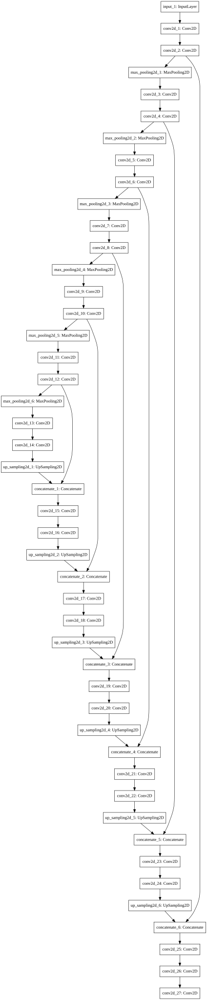

In [11]:
from keras.models import Sequential
from keras.layers import *
from keras.models import Model
from keras.utils import plot_model
from IPython.display import SVG, display
from keras.utils.vis_utils import model_to_dot

import gc
K.clear_session()
gc.collect()


image_height       = 256
image_width        = 512
image_channels     = 3

# Model options
batch_size = 10
lstm_output_size = 300
cnn_kernel_count = 40

# Build an hourglass model. Notes on the model structure:
# Two camera frames as input.
# frame0 -> Conv and pooling until embedding (shared convoluations to both frame0 and frame1)
# frame1 -> Conv and pooling until embedding
# Conv both paths together
# Residual upsampling of frame1 until original size
# Pixel-wise error to frame2 as loss

pp.pprint("Input shape without batches:")
pp.pprint((image_height, image_width, image_channels))

# Used to give fixed names to the layers for transferring the model
conv_num = 0 
pool_num = 0
dense_num = 0


# Create the embedding module, the same model runs both frames
frame_in = Input(shape=(image_height, image_width, image_channels,))
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(frame_in)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
res0 = x

x = MaxPooling2D((1, 2))(x)

x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
res1 = x

x = MaxPooling2D((2, 2))(x)



x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
res2 = x
x = MaxPooling2D((2, 2))(x)



x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
res3 = x
x = MaxPooling2D((2, 2))(x)



x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
res4 = x
x = MaxPooling2D((2, 2))(x)



x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
res5 = x
x = MaxPooling2D((2, 2))(x)


# Start the upsampling and residual joining

x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)

# Create the upsampling stages, feeding residual from frame1
x = UpSampling2D(size=(2, 2), data_format=None)(x)
#res5 = Cropping2D(cropping=(((0, 0), (1, 0))), data_format=None)(res4_b)
x = keras.layers.concatenate([x, res5])
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)

x = UpSampling2D(size=(2, 2), data_format=None)(x)
#res5 = Cropping2D(cropping=(((0, 0), (1, 0))), data_format=None)(res4_b)
x = keras.layers.concatenate([x, res4])
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)

x = UpSampling2D(size=(2, 2), data_format=None)(x)
#res5 = Cropping2D(cropping=(((0, 0), (1, 0))), data_format=None)(res4_b)
x = keras.layers.concatenate([x, res3])
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)

x = UpSampling2D(size=(2, 2), data_format=None)(x)
#res5 = Cropping2D(cropping=(((0, 0), (1, 0))), data_format=None)(res4_b)
x = keras.layers.concatenate([x, res2])
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)

x = UpSampling2D(size=(2, 2), data_format=None)(x)
#res5 = Cropping2D(cropping=(((0, 0), (1, 0))), data_format=None)(res4_b)
x = keras.layers.concatenate([x, res1])
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)

x = UpSampling2D(size=(1, 2), data_format=None)(x)
#res5 = Cropping2D(cropping=(((0, 0), (1, 0))), data_format=None)(res4_b)
x = keras.layers.concatenate([x, res0])
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)
x = Conv2D(cnn_kernel_count, (3, 3),
           padding = "same",
           activation = "relu",)(x)

# RGB output as three channels
x = Conv2D(3, (1, 1),
           padding = "same",
           activation = "relu",)(x)

frame_prediction_model = Model([frame_in], [x])

# For a multi-class classification problem
frame_prediction_model.compile(optimizer=keras.optimizers.RMSprop(lr=0.00002),
#model.compile(optimizer=keras.optimizers.adam(),
              loss='categorical_crossentropy',
              metrics=['categorical_accuracy'])


frame_prediction_model.summary()

#plot_model(frame_prediction_model, to_file='model.png')
from IPython.display import SVG, display
from keras.utils.vis_utils import model_to_dot
display(SVG(model_to_dot(frame_prediction_model).create(prog='dot', format='svg')))

# Train the model to predict the future position. This is the control signal to the robot AI
WEIGHTS_FNAME = '.\\Goalie3Frames\\weights_%i.hdf'
MODELS_FNAME = '.\\Goalie3Frames\\models_%i.h5'

In [ ]:
# For a multi-class classification problem
frame_prediction_model.compile(optimizer=keras.optimizers.RMSprop(lr=0.00005),
#model.compile(optimizer=keras.optimizers.adam(),
              loss='mean_squared_error',
              metrics=['mean_squared_error'])

# Was ran on the above simple model, not pre-trained Inceptionv3 run.
epoch = 0
#batches_validation_per_epoch = 50
#batches_training_per_epoch = 400
batch_size = 4
batches_training_per_epoch = 100
batches_validation_per_epoch = 20
print("Batch size %i: %i training batches, %i validation batches" % (batch_size, batches_training_per_epoch, batches_validation_per_epoch) )
WEIGHTS_FNAME = '.\\Models\\weights_%i.hdf'
MODELS_FNAME = '.\\Models\\models_%i.h5'

for i in range(50):
    frame_prediction_model.fit_generator(
        TrainBatchGen(batch_size, training=training),
        batches_training_per_epoch,
        epochs=epoch+1,
        verbose=1,
        callbacks=None,
        class_weight=None,
        max_q_size=50,
        workers=50,
        validation_data=TrainBatchGen(batch_size, validation),
        validation_steps = batches_validation_per_epoch,
        pickle_safe=False,
        initial_epoch=epoch)
    
    epoch += 1
    
    # Plot occasional validation data plot
    if i % 5 == 0:
        plot_validate(TrainBatchGen(batch_size, validation), frame_prediction_model, 50, "Epoch validation results %i" % epoch)
    
    # Save the model
    frame_prediction_model.save_weights(WEIGHTS_FNAME % epoch)
    frame_prediction_model.save(MODELS_FNAME % epoch)
    print(("Wrote model to " + WEIGHTS_FNAME )  % epoch)



Batch size 4: 100 training batches, 20 validation batches
Epoch 1/1
  4/100 [>.............................] - ETA: 487s - loss: 0.0459 - mean_squared_error: 0.0459

In [ ]:
from keras.models import load_model

#import gc
#K.clear_session()
#gc.collect()

# Was ran on the above simple model, not pre-trained Inceptionv3 run.
WEIGHTS_FNAME = '.\\Models\\weights_%i.hdf'
MODELS_FNAME = '.\\Models\\models_%i.h5'

frame_prediction_model.load_weights(WEIGHTS_FNAME % 50)

# For a multi-class classification problem
frame_prediction_model.compile(optimizer=keras.optimizers.RMSprop(lr=0.000005),
#model.compile(optimizer=keras.optimizers.adam(),
              loss='mean_squared_error',
              metrics=['mean_squared_error'])


#model = load_model(MODELS_FNAME % 50)
epoch = 51
#batches_validation_per_epoch = 50
#batches_training_per_epoch = 400
batch_size = 10
batches_training_per_epoch = 500
batches_validation_per_epoch = 50
print("Batch size %i: %i training batches, %i validation batches" % (batch_size, batches_training_per_epoch, batches_validation_per_epoch) )
WEIGHTS_FNAME = '.\\Models\\weights_%i.hdf'
MODELS_FNAME = '.\\Models\\models_%i.h5'

for i in range(50):
    frame_prediction_model.fit_generator(
        TrainBatchGen(batch_size, training=training),
        batches_training_per_epoch,
        epochs=epoch+1,
        verbose=1,
        callbacks=None,
        class_weight=None,
        max_q_size=50,
        workers=50,
        validation_data=TrainBatchGen(batch_size, validation),
        validation_steps = batches_validation_per_epoch,
        pickle_safe=False,
        initial_epoch=epoch)
    
    epoch += 1
    
    # Plot occasional validation data plot
    if i % 5 == 0:
        plot_validate(TrainBatchGen(batch_size, validation), frame_prediction_model, 500, "Epoch validation results %i" % epoch)
    
    # Save the model
    frame_prediction_model.save_weights(WEIGHTS_FNAME % epoch)
    frame_prediction_model.save(MODELS_FNAME % epoch)
    print(("Wrote model to " + WEIGHTS_FNAME )  % epoch)



In [ ]:
# Export the model weights for a transfer-learning model
foosball_embedding.save_weights("foosball_embedding.hdf")